In the past months, the longtime-coming debate about environmental sustainability became finally of primary interest. While the importance of having green policies coming from the Governments and from other international institutions is fundamental for a structured and effective revolution, we should not forget the impact that the individuals can have on the path towards a more environmentally sustainable lifestyle.

Almost everywhere I have been in Europe (either for living or just visiting) I noticed one thing: **every shop has the door open all day, every day, no matter the season**.

I thus wonder: **how much energy do we waste for that open door?**

To investigate this, I want to tell you a story

***Note***: this notebook is still a work in progress, any feedback to improve it or correct it will be very welcome.

# A tale of three streets

In my 5 years in the Netherlands, I can safely say that most of the cities have that one street in the city center entirely devoted to shops. Imagine a 200-300 meters long line of shopping windows and open doors on both sides, giving you cold air in the summer and warm in the winter when you walk by them. Such streets are very common in Europe (and I imagine not only there). Three of these streets are the one that caught my attention the most:

* Herestraat in Groningen
* Haarlemmerstraat in Leiden
* Grote Houtstraat in Haarlem

None of these cities is what we could call a big city (even for Dutch standards) and, for how beautiful they are (and they are, you should visit them), they are not a major touristic destination (i.e. there are streets in Amsterdam that even more surprising but they are flooded by tourists almost 24/7).

Since the data are anonymized by grouping at least 10 connections together, it is difficult to isolate the consumption of a single shop but we can observe the annual consumption of a street. Due to the fact that every street has a different number of connections, in order to compare one street with another one, we will focus on energy consumption per connection.

In [1]:
import pandas as pd
import numpy as np

from os.path import join, isfile
from os import path, scandir, listdir

import warnings

pd.set_option('max_columns', 100)

#visualization
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import imageio

In [2]:
def list_all_files(location='../input/', pattern=None, recursive=True):
    """
    This function returns a list of files at a given location (including subfolders)
    
    - location: path to the directory to be searched
    - pattern: part of the file name to be searched (ex. pattern='.csv' would return all the csv files)
    - recursive: boolean, if True the function calls itself for every subdirectory it finds
    """
    subdirectories= [f.path for f in scandir(location) if f.is_dir()]
    files = [join(location, f) for f in listdir(location) if isfile(join(location, f))]
    if recursive:
        for directory in subdirectories:
            files.extend(list_all_files(directory))
    if pattern:
        files = [f for f in files if pattern in f]
    return files


def importer(file_list):
    imported = {}
    for file in file_list:
        yr = file.split('_')[-1].split('.')[0]
        if '0101' in yr:
            yr = yr.replace('0101', '')
        name = file.split('/')[-1].split('_')[0]
        # print(name, yr)
        df = pd.read_csv(file)
        # print(df.shape)
        imported[name + '_' + yr] = df
        del df
    return imported


def find_street(energy_list, city_name, street_name):
    res_street = pd.DataFrame({'city': [], 'street': [], 'year': [], #'provider': [], 
                           'num_connections': [], 'active_connections': [], 
                           'annual_consume': []})
    for key in energy_list.keys():
        yr = str(int(key.split('_')[1]) - 1)
        provider = key.split('_')[0]
        tmp = energy_list[key].copy()
        if (city_name in set(tmp.city)) and (street_name in set(tmp.street)):
            tmp = tmp[(tmp.city==city_name) & (tmp.street==street_name)].copy()
            tmp['active_connections'] = (tmp['num_connections'] * tmp['perc_of_active_connections'] / 100).astype(int)
            tmp = tmp.groupby(['city', 'street'], as_index=False).sum()
            tmp['year'] = yr
            #tmp['provider'] = provider
            tmp = tmp[['city', 'street', 'year', 'num_connections', 
                       'active_connections', 'annual_consume']].copy()
            res_street = pd.concat([res_street, tmp])
    res_street = res_street.groupby(['city', 'street', 'year'], as_index=False).sum()
    res_street['consume_per_connection'] = res_street['annual_consume'] / res_street['active_connections']
    res_street = res_street.sort_values('year')
    return res_street


def avg_consume_city(energy_list, city_name):
    res_city = pd.DataFrame({'city': [], 'year': [], #'provider': [], 
                           'num_connections': [], 'active_connections': [], 
                           'annual_consume': []})
    for key in energy_list.keys():
        yr = str(int(key.split('_')[1]) - 1)
        provider = key.split('_')[0]
        tmp = energy_list[key].copy()
        if city_name in set(tmp.city):
            tmp = tmp[tmp.city==city_name].copy()
            tmp['active_connections'] = (tmp['num_connections'] * tmp['perc_of_active_connections'] / 100).astype(int)
            tmp = tmp.groupby(['city'], as_index=False).sum()
            tmp['year'] = yr
            #tmp['provider'] = provider
            tmp = tmp[['city', 'year', 'num_connections', 
                       'active_connections', 'annual_consume']].copy()
            res_city = pd.concat([res_city, tmp])
    res_city = res_city.groupby(['city', 'year'], as_index=False).sum()
    res_city['consume_per_connection'] = res_city['annual_consume'] / res_city['active_connections']
    res_city = res_city.sort_values('year')
    return res_city


def elec_gas_comparison(el_list, ga_list, city_name, street_name):
    el_city = avg_consume_city(el_list, city_name)
    ga_city = avg_consume_city(ga_list, city_name)
    el_street = find_street(el_list, city_name, street_name)
    ga_street = find_street(ga_list, city_name, street_name)
    
    ren_city = {'active_connections': 'city_active_connections', 
            'num_connections': 'city_num_connections',
            'annual_consume': 'city_annual_consume', 
            'consume_per_connection': 'city_consume_per_connection'}
    
    el_city = el_city.rename(columns=ren_city)
    ga_city = ga_city.rename(columns=ren_city)
    el_city.columns = ['city', 'year'] + [col+'_e' for col in el_city.columns if col not in ['city', 'year']]
    ga_city.columns = ['city', 'year'] + [col+'_g' for col in ga_city.columns if col not in ['city', 'year']]
    el_street.columns = ['city', 'street', 'year'] + \
                        [col+'_e' for col in el_street.columns if col not in ['city', 'street', 'year']]
    ga_street.columns = ['city', 'street', 'year'] + \
                        [col+'_g' for col in ga_street.columns if col not in ['city', 'street', 'year']]
    
    el_street = pd.merge(el_street, el_city[['year', 'city_num_connections_e', 'city_active_connections_e', 
                                             'city_annual_consume_e', 'city_consume_per_connection_e']], on='year')
    el_street['excess_perc_e'] = el_street['consume_per_connection_e'] / el_street['city_consume_per_connection_e']*100
    ga_street = pd.merge(ga_street, ga_city[['year', 'city_num_connections_g', 'city_active_connections_g', 
                                             'city_annual_consume_g', 'city_consume_per_connection_g']], on='year')
    ga_street['excess_perc_g'] = ga_street['consume_per_connection_g'] / ga_street['city_consume_per_connection_g']*100
    result = pd.merge(el_street, ga_street, on=['city', 'street', 'year'])
    return result


def consume_city_distribution(energy_list, city_name):
    res_city = pd.DataFrame({'city': [], 'street': [], 'year': [],
                           'num_connections': [], 'active_connections': [], 
                           'annual_consume': []})
    for key in energy_list.keys():
        yr = str(int(key.split('_')[1]) - 1)
        tmp = energy_list[key].copy()
        if city_name in set(tmp.city):
            tmp = tmp[tmp.city==city_name].copy()
            tmp['active_connections'] = (tmp['num_connections'] * tmp['perc_of_active_connections'] / 100).astype(int)
            tmp = tmp.groupby(['city', 'street'], as_index=False).sum()
            tmp['year'] = yr
            tmp = tmp[['city', 'street', 'year', 'num_connections', 
                       'active_connections', 'annual_consume']].copy()
            res_city = pd.concat([res_city, tmp])
    res_city = res_city.groupby(['city', 'street', 'year'], as_index=False).sum()
    res_city = res_city.groupby(['city', 'street'], as_index=False).sum()
    res_city['consume_per_connection'] = res_city['annual_consume'] / res_city['active_connections']
    res_city = res_city.sort_values('consume_per_connection', ascending=False)
    return res_city


def consume_by_street(energy_list):
    res_en = pd.DataFrame({'city': [], 'street': [], 'year': [],
                           'num_connections': [], 'active_connections': [], 
                           'annual_consume': []})
    for key in energy_list.keys():
        yr = str(int(key.split('_')[1]) - 1)
        tmp = energy_list[key].copy()
        tmp['active_connections'] = (tmp['num_connections'] * tmp['perc_of_active_connections'] / 100).astype(int)
        tmp = tmp.groupby(['city', 'street'], as_index=False).sum()
        tmp['year'] = yr
        tmp = tmp[['city', 'street', 'year', 'num_connections', 
                   'active_connections', 'annual_consume']].copy()
        res_en = pd.concat([res_en, tmp])
    res_en = res_en.groupby(['city', 'street', 'year'], as_index=False).sum()
    res_en['consume_per_connection'] = res_en['annual_consume'] / res_en['active_connections']
    return res_en

In [3]:
elec_list = list_all_files('cleaned_data/Electricity/')
gas_list = list_all_files('cleaned_data/Gas/')
imp_elec = importer(elec_list)
imp_gas = importer(gas_list)

elec = consume_by_street(imp_elec)
gas = consume_by_street(imp_gas)

In [4]:
gro_her = elec_gas_comparison(imp_elec, imp_gas, 'GRONINGEN', 'Herestraat')

gro_her

,city,street,year,num_connections_e,active_connections_e,annual_consume_e,consume_per_connection_e,city_num_connections_e,city_active_connections_e,city_annual_consume_e,city_consume_per_connection_e,excess_perc_e,num_connections_g,active_connections_g,annual_consume_g,consume_per_connection_g,city_num_connections_g,city_active_connections_g,city_annual_consume_g,city_consume_per_connection_g,excess_perc_g
0,GRONINGEN,Herestraat,2009,112.0,112.0,136928.00,1222.571429,88889.0,88889.0,15534663.00,174.764740,699.552682,113.0,113.0,32346.00,286.247788,82707.0,82707.0,7272815.00,87.934697,325.523140
1,GRONINGEN,Herestraat,2010,115.0,115.0,153999.00,1339.121739,89906.0,89906.0,15711535.00,174.755133,766.284638,114.0,114.0,39652.00,347.824561,83311.0,83311.0,7441253.00,89.318973,389.418449
2,GRONINGEN,Herestraat,2011,118.0,118.0,125371.00,1062.466102,92009.0,92009.0,15889435.00,172.694356,615.229198,116.0,116.0,39500.00,340.517241,85042.0,85042.0,7404471.00,87.068401,391.091642
3,GRONINGEN,Herestraat,2012,125.0,125.0,138134.00,1105.072000,95249.0,95249.0,16246745.00,170.571292,647.865175,122.0,122.0,40662.00,333.295082,89084.0,89084.0,7552584.00,84.780477,393.127161
4,GRONINGEN,Herestraat,2013,126.0,126.0,142934.00,1134.396825,95843.0,95843.0,16195745.00,168.982033,671.312094,122.0,122.0,37881.00,310.500000,89417.0,89417.0,7380296.00,82.537951,376.190582
5,GRONINGEN,Herestraat,2014,126.0,126.0,121425.00,963.690476,96042.0,96042.0,15743630.00,163.924429,587.887042,123.0,123.0,37010.00,300.894309,89670.0,89670.0,7188979.00,80.171507,375.313277
6,GRONINGEN,Herestraat,2015,127.0,127.0,144199.00,1135.425197,96556.0,96556.0,15298791.00,158.444747,716.606399,120.0,120.0,35129.00,292.741667,89968.0,89968.0,6910605.00,76.811811,381.115434
7,GRONINGEN,Herestraat,2016,124.0,124.0,136175.00,1098.185484,97042.0,97042.0,15054696.00,155.135879,707.886202,117.0,117.0,35677.00,304.931624,90415.0,90415.0,6924815.00,76.589227,398.139052
8,GRONINGEN,Herestraat,2017,126.0,126.0,142173.22,1128.358889,98557.0,98557.0,16091276.29,163.268731,691.105323,121.0,121.0,33385.39,275.912314,91708.0,91708.0,7438972.99,81.115857,340.145965
9,GRONINGEN,Herestraat,2018,126.0,126.0,142815.11,1133.453254,99112.0,99112.0,15674123.34,158.145566,716.715165,121.0,121.0,33888.20,280.067769,91900.0,91900.0,7378377.88,80.287028,348.833149


We start with Heerestraat in Groningen, a very cold city in the far north of the country. The connections in this shopping street have consistently consumed **between 600% and 700% of the city average**, while the gas connections about **350-400%** of the city average. Even in terms of absolute values, the electricity consumption in Heererstraat (for 2018) was about 1% of the city consumption with only 0.1% of the connections.

Interesting to notice, and it is going to be a trend for all three streets, growth in the number of connections and a negative trend in the consumption per connection, possibly indicating a more energy-efficient consume.

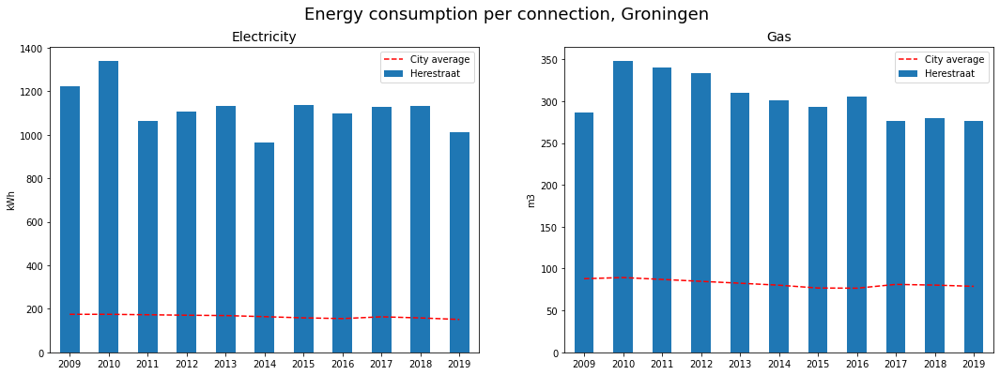

In [5]:
fig, ax = plt.subplots(1,2, figsize=(18, 6))

gro_her[['year', 'consume_per_connection_e']].plot(kind='bar', x= 'year', ax=ax[0], label='Consume per connection')
gro_her[gro_her.consume_per_connection_e>0][['year', 'city_consume_per_connection_e']].plot(color='r', x= 'year', ax=ax[0], label='City average', linestyle='--')
ax[0].legend(["City average", "Herestraat"])
ax[0].set_title('Electricity', fontsize=14)
ax[0].set_xlabel('')
ax[0].set_ylabel('kWh')

gro_her[['year', 'consume_per_connection_g']].plot(kind='bar', x= 'year', ax=ax[1], label='Consume per connection')
gro_her[gro_her.consume_per_connection_g>0][['year', 'city_consume_per_connection_g']].plot(color='r', x= 'year', ax=ax[1], label='City average', linestyle='--')
ax[1].legend(["City average", "Herestraat"])
ax[1].set_title('Gas', fontsize=14)
ax[1].set_xlabel('')
ax[1].set_ylabel('m3')

fig.suptitle('Energy consumption per connection, Groningen', fontsize=18)
plt.show()

This is how the consumption per connection is distributed in Groningen (averaged across the years)

*Note: The connections with 0 consumption are not taken into consideration when the mean is computed*

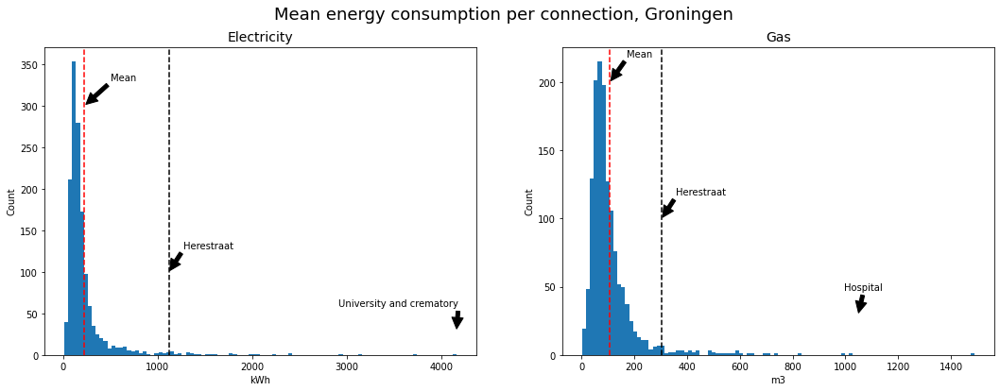

In [6]:
fig, ax = plt.subplots(1,2, figsize=(18, 6))

test = consume_city_distribution(imp_elec, 'GRONINGEN')
test.consume_per_connection.replace(np.inf, 0).hist(bins=100, ax=ax[0])
ax[0].axvline(x=test[test.street == 'Herestraat'].consume_per_connection.values[0], color='k', linestyle='--')
ax[0].axvline(x=test.consume_per_connection.replace(np.inf, 0).mean(), color='r', linestyle='--')
ax[0].annotate('Herestraat',
            xy=(test[test.street == 'Herestraat'].consume_per_connection.values[0], 100), 
            xycoords='data', xytext=(15, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05))
ax[0].annotate('University and crematory',
            xy=(test.consume_per_connection.max(), 30), 
            xycoords='data', xytext=(-125, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05))
ax[0].annotate('Mean',
            xy=(test.consume_per_connection[test.consume_per_connection>0].mean(), 300), xycoords='data',
            xytext=(55, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom')
ax[0].grid(False)
ax[0].set_title('Electricity', fontsize=14)
ax[0].set_xlabel('kWh')
ax[0].set_ylabel('Count')

test = consume_city_distribution(imp_gas, 'GRONINGEN')
test.consume_per_connection.replace(np.inf, 0).hist(bins=100, ax=ax[1])
ax[1].axvline(x=test[test.street == 'Herestraat'].consume_per_connection.values[0], color='k', linestyle='--')
ax[1].axvline(x=test.consume_per_connection.replace(np.inf, 0).mean(), color='r', linestyle='--')
ax[1].annotate('Herestraat',
            xy=(test[test.street == 'Herestraat'].consume_per_connection.values[0], 100), 
            xycoords='data', xytext=(15, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05))
ax[1].annotate('Hospital',
            xy=(1048.89, 30), 
            xycoords='data', xytext=(-15, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05))
ax[1].annotate('Mean',
            xy=(test.consume_per_connection[test.consume_per_connection>0].mean(), 200), xycoords='data',
            xytext=(45, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom')
ax[1].grid(False)
ax[1].set_title('Gas', fontsize=14)
ax[1].set_xlabel('m3')
ax[1].set_ylabel('Count')

fig.suptitle('Mean energy consumption per connection, Groningen', fontsize=18)
plt.show()

We see how the shopping street consumption is significantly above the city average. Other outliers in this distribution are generally associated with the presence of several university buildings, the crematory, a hospital, and an industrial area.

Let's then move on to the second street of our story.

In [7]:
lei_haa = elec_gas_comparison(imp_elec, imp_gas, 'LEIDEN', 'Haarlemmerstraat')
lei_haa

,city,street,year,num_connections_e,active_connections_e,annual_consume_e,consume_per_connection_e,city_num_connections_e,city_active_connections_e,city_annual_consume_e,city_consume_per_connection_e,excess_perc_e,num_connections_g,active_connections_g,annual_consume_g,consume_per_connection_g,city_num_connections_g,city_active_connections_g,city_annual_consume_g,city_consume_per_connection_g,excess_perc_g
0,LEIDEN,Haarlemmerstraat,2008,272.0,255.0,240967.0,944.968627,56390.0,54145.0,10777534.0,199.049478,474.740570,279.0,270.0,47365.0,175.425926,48823.0,48228.0,3825461.0,79.320333,221.161360
1,LEIDEN,Haarlemmerstraat,2009,274.0,257.0,241553.0,939.894942,56770.0,54569.0,10863563.0,199.079386,472.120676,281.0,271.0,48538.0,179.107011,49020.0,48346.0,3821945.0,79.054007,226.562851
2,LEIDEN,Haarlemmerstraat,2010,277.0,257.0,237379.0,923.653696,57417.0,54539.0,10872895.0,199.359999,463.309440,285.0,268.0,48492.0,180.940299,49167.0,48190.0,3793892.0,78.727786,229.830290
3,LEIDEN,Haarlemmerstraat,2011,281.0,260.0,230634.0,887.053846,57941.0,55040.0,10776301.0,195.790352,453.063103,291.0,269.0,46390.0,172.453532,49385.0,48197.0,3691128.0,76.584186,225.181648
4,LEIDEN,Haarlemmerstraat,2012,281.0,260.0,220376.0,847.600000,58494.0,55385.0,10665824.0,192.576040,440.137827,292.0,271.0,42964.0,158.538745,49613.0,48241.0,3553615.0,73.663792,215.219364
5,LEIDEN,Haarlemmerstraat,2013,279.0,257.0,213511.0,830.782101,58972.0,55318.0,10670046.0,192.885607,430.712335,293.0,269.0,42595.0,158.345725,49821.0,48292.0,3577997.0,74.090885,213.718227
6,LEIDEN,Haarlemmerstraat,2014,287.0,267.0,195838.0,733.475655,59998.0,55457.0,10421468.0,187.919794,390.313144,295.0,268.0,41401.0,154.481343,49987.0,48043.0,3433034.0,71.457528,216.186242
7,LEIDEN,Haarlemmerstraat,2015,287.0,266.0,193378.0,726.984962,61349.0,56637.0,10278028.0,181.471971,400.604545,296.0,268.0,39683.0,148.070896,50552.0,48319.0,3356919.0,69.474099,213.131076
8,LEIDEN,Haarlemmerstraat,2016,288.0,262.0,186745.0,712.767176,62465.0,57744.0,10073943.0,174.458697,408.559268,299.0,270.0,39549.0,146.477778,51071.0,48758.0,3328105.0,68.257619,214.595498
9,LEIDEN,Haarlemmerstraat,2017,319.0,283.0,202652.0,716.084806,63460.0,58638.0,9952011.0,169.719482,421.922573,309.0,278.0,39754.0,143.000000,51568.0,48979.0,3300809.0,67.392331,212.190315


Haarlemmerstraat in Leiden, which is in South Holland, exhibits a very similar behavior: about 400-450% of the average consumption of electricity and 220% for the gas consumption. 

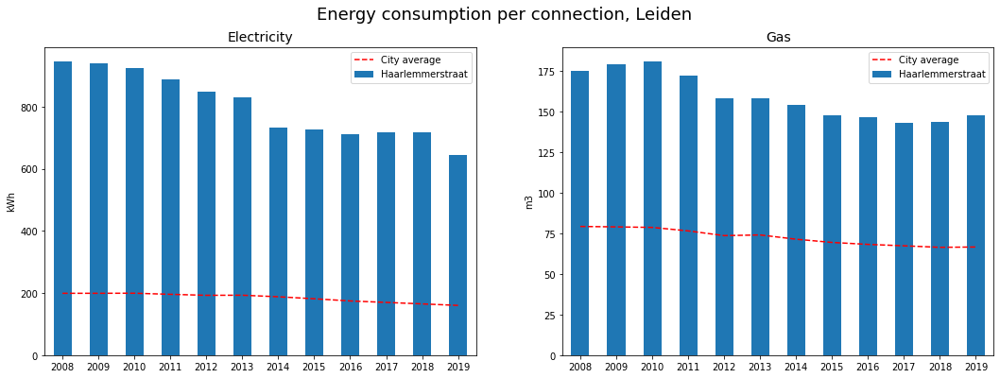

In [8]:
fig, ax = plt.subplots(1,2, figsize=(18, 6))

lei_haa[['year', 'consume_per_connection_e']].plot(kind='bar', x= 'year', ax=ax[0], label='Consume per connection')
lei_haa[lei_haa.consume_per_connection_e>0][['year', 'city_consume_per_connection_e']].plot(color='r', x= 'year', ax=ax[0], label='City average', linestyle='--')
ax[0].legend(["City average", "Haarlemmerstraat"])
ax[0].set_title('Electricity', fontsize=14)
ax[0].set_xlabel('')
ax[0].set_ylabel('kWh')

lei_haa[['year', 'consume_per_connection_g']].plot(kind='bar', x= 'year', ax=ax[1], label='Consume per connection')
lei_haa[lei_haa.consume_per_connection_g>0][['year', 'city_consume_per_connection_g']].plot(color='r', x= 'year', ax=ax[1], label='City average', linestyle='--')
ax[1].legend(["City average", "Haarlemmerstraat"])
ax[1].set_title('Gas', fontsize=14)
ax[1].set_xlabel('')
ax[1].set_ylabel('m3')

fig.suptitle('Energy consumption per connection, Leiden', fontsize=18)
plt.show()

To put things into perspective, here is how the consumption per connection is distributed in Leiden

*Note: The connections with 0 consumption are not taken into consideration when the mean is computed*

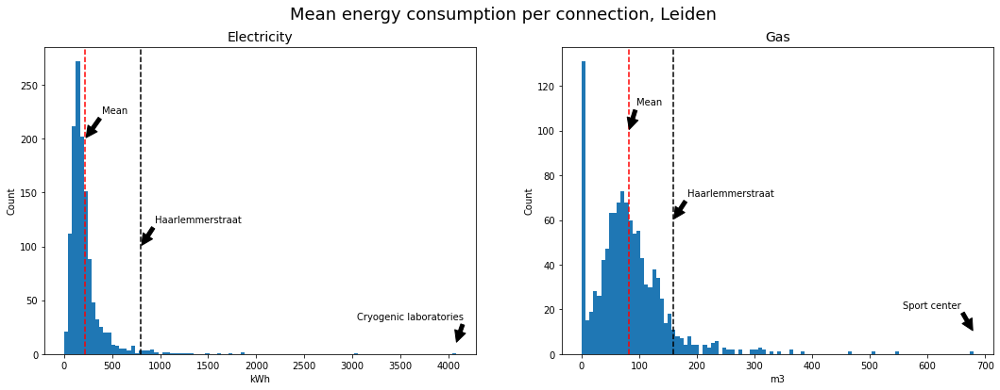

In [9]:
fig, ax = plt.subplots(1,2, figsize=(18, 6))

test = consume_city_distribution(imp_elec, 'LEIDEN')
test.consume_per_connection.replace(np.inf, 0).hist(bins=100, ax=ax[0])
ax[0].axvline(x=test[test.street == 'Haarlemmerstraat'].consume_per_connection.values[0], color='k', linestyle='--')
ax[0].axvline(x=test.consume_per_connection.replace(np.inf, 0).mean(), color='r', linestyle='--')
ax[0].annotate('Haarlemmerstraat',
            xy=(test[test.street == 'Haarlemmerstraat'].consume_per_connection.values[0], 100), 
            xycoords='data', xytext=(15, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05))
ax[0].annotate('Cryogenic laboratories',
            xy=(test.consume_per_connection.replace(np.inf, 0).max(), 10), 
            xycoords='data', xytext=(-105, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05))
ax[0].annotate('Mean',
            xy=(test.replace(np.inf, 0)[test.consume_per_connection>0].consume_per_connection.mean(), 200), xycoords='data',
            xytext=(45, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom')
ax[0].grid(False)
ax[0].set_title('Electricity', fontsize=14)
ax[0].set_xlabel('kWh')
ax[0].set_ylabel('Count')

test = consume_city_distribution(imp_gas, 'LEIDEN')
test.consume_per_connection.replace(np.inf, 0).hist(bins=100, ax=ax[1])
ax[1].axvline(x=test[test.street == 'Haarlemmerstraat'].consume_per_connection.values[0], color='k', linestyle='--')
ax[1].axvline(x=test.consume_per_connection.replace(np.inf, 0).mean(), color='r', linestyle='--')
ax[1].annotate('Haarlemmerstraat',
            xy=(test[test.street == 'Haarlemmerstraat'].consume_per_connection.values[0], 60), 
            xycoords='data', xytext=(15, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05))
ax[1].annotate('Sport center',
            xy=(test.consume_per_connection.replace(np.inf, 0).max(), 10), 
            xycoords='data', xytext=(-75, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05))
ax[1].annotate('Mean',
            xy=(test.replace(np.inf, 0)[test.consume_per_connection>0].consume_per_connection.mean(), 100), xycoords='data',
            xytext=(35, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom')
ax[1].grid(False)
ax[1].set_title('Gas', fontsize=14)
ax[1].set_xlabel('m3')
ax[1].set_ylabel('Count')

fig.suptitle('Mean energy consumption per connection, Leiden', fontsize=18)
plt.show()

Again, while the shopping street is not the only anomaly of the city, it does not have a good reason for it as much as, for example, a street with cryogenic laboratories in it.

The third and last protagonist of our story is in Haarlem, a small city next to Amsterdam.

In [10]:
haa_gro = elec_gas_comparison(imp_elec, imp_gas, 'HAARLEM', 'Grote Houtstraat')
haa_gro

,city,street,year,num_connections_e,active_connections_e,annual_consume_e,consume_per_connection_e,city_num_connections_e,city_active_connections_e,city_annual_consume_e,city_consume_per_connection_e,excess_perc_e,num_connections_g,active_connections_g,annual_consume_g,consume_per_connection_g,city_num_connections_g,city_active_connections_g,city_annual_consume_g,city_consume_per_connection_g,excess_perc_g
0,HAARLEM,Grote Houtstraat,2008,299.0,272.0,335026.0,1231.713235,78715.0,74913.0,14283779.00,190.671566,645.986847,260.0,252.0,59178.0,234.833333,69910.0,68677.0,6399395.00,93.181050,252.018337
1,HAARLEM,Grote Houtstraat,2009,301.0,273.0,337248.0,1235.340659,79682.0,75254.0,14692314.00,195.236320,632.741214,262.0,252.0,58772.0,233.222222,70467.0,68999.0,6219559.00,90.139843,258.733780
2,HAARLEM,Grote Houtstraat,2010,302.0,276.0,330212.0,1196.420290,80358.0,76032.0,14426262.00,189.739347,630.559929,263.0,252.0,55914.0,221.880952,71003.0,69553.0,6166967.00,88.665723,250.244340
3,HAARLEM,Grote Houtstraat,2011,304.0,272.0,310556.0,1141.750000,81753.0,76941.0,14374937.00,186.830649,611.114934,264.0,252.0,57461.0,228.019841,71801.0,69965.0,6160421.00,88.050039,258.966200
4,HAARLEM,Grote Houtstraat,2012,309.0,271.0,284685.0,1050.498155,82610.0,77199.0,14252342.00,184.618220,569.011094,269.0,250.0,55066.0,220.264000,72405.0,70088.0,5943486.00,84.800337,259.744252
5,HAARLEM,Grote Houtstraat,2013,306.0,267.0,279627.0,1047.292135,83062.0,76931.0,14231936.00,184.996113,566.115750,269.0,248.0,56092.0,226.177419,73057.0,70639.0,5876916.00,83.196478,271.859369
6,HAARLEM,Grote Houtstraat,2014,310.0,266.0,300268.0,1128.827068,83555.0,77453.0,13752942.00,177.565001,635.726108,269.0,250.0,50934.0,203.736000,73350.0,71038.0,5658199.00,79.650314,255.788069
7,HAARLEM,Grote Houtstraat,2015,311.0,264.0,290328.0,1099.727273,84061.0,77658.0,13538146.00,174.330346,630.829513,272.0,248.0,49620.0,200.080645,73771.0,71202.0,5504080.00,77.302323,258.828762
8,HAARLEM,Grote Houtstraat,2016,314.0,264.0,270759.0,1025.602273,84719.0,77930.0,13298111.00,170.641743,601.026605,276.0,251.0,51179.0,203.900398,74293.0,71486.0,5410221.00,75.682245,269.416423
9,HAARLEM,Grote Houtstraat,2017,324.0,270.0,255745.0,947.203704,85695.0,78146.0,13119663.00,167.886558,564.192698,286.0,254.0,48053.0,189.185039,74958.0,71523.0,5403761.00,75.552773,250.401185


Grote Houtstraat in the close-by Haarlem has even more extreme excess, maching what we were able to observe in the much colder and darker Groningen.

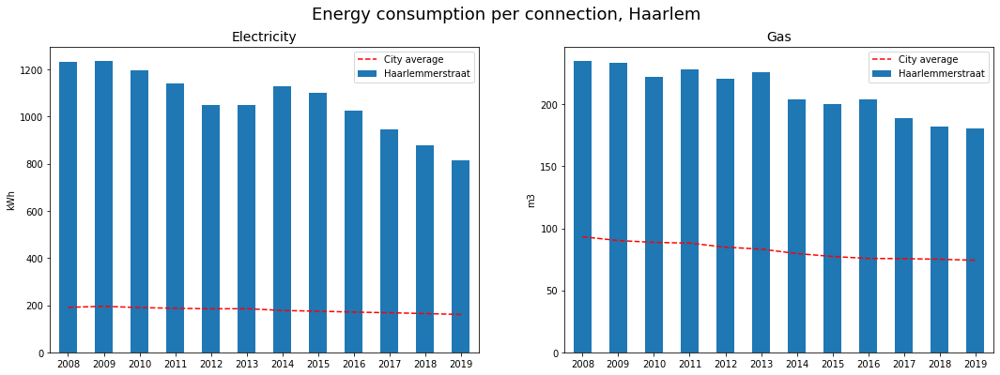

In [11]:
fig, ax = plt.subplots(1,2, figsize=(18, 6))

haa_gro[['year', 'consume_per_connection_e']].plot(kind='bar', x= 'year', ax=ax[0], label='Consume per connection')
haa_gro[['year', 'city_consume_per_connection_e']].plot(color='r', x= 'year', ax=ax[0], label='City average', linestyle='--')
ax[0].legend(["City average", "Haarlemmerstraat"])
ax[0].set_title('Electricity', fontsize=14)
ax[0].set_xlabel('')
ax[0].set_ylabel('kWh')

haa_gro[['year', 'consume_per_connection_g']].plot(kind='bar', x= 'year', ax=ax[1], label='Consume per connection')
haa_gro[['year', 'city_consume_per_connection_g']].plot(color='r', x= 'year', ax=ax[1], label='City average', linestyle='--')
ax[1].legend(["City average", "Haarlemmerstraat"])
ax[1].set_title('Gas', fontsize=14)
ax[1].set_xlabel('')
ax[1].set_ylabel('m3')

fig.suptitle('Energy consumption per connection, Haarlem', fontsize=18)
plt.show()

To observe the distribution of the consumption as above, we have to cut out some strong outliers coming from a very inconsistent count of the number of connections (thus blowing the consumption per connection out of proportion)

*Note: The connections with 0 consumption are not taken into consideration when the mean is computed*

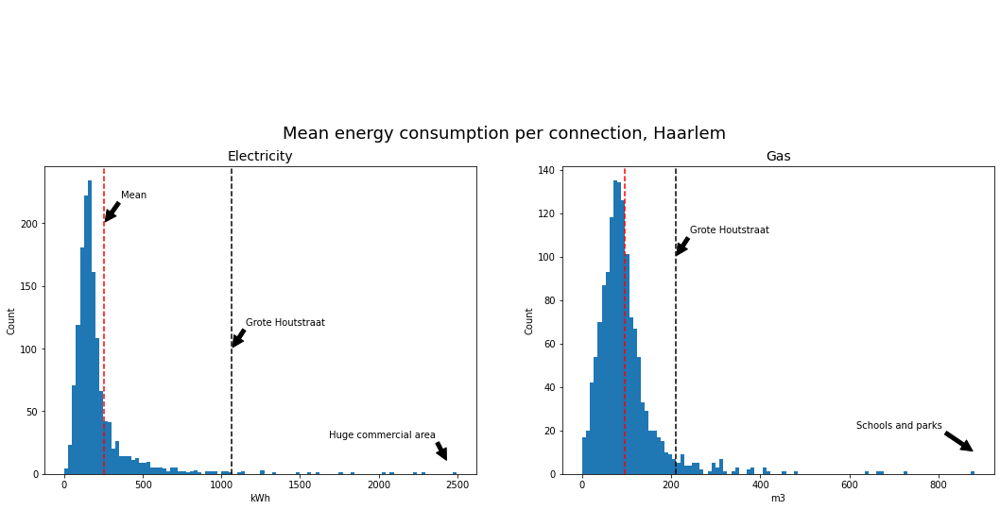

In [12]:
fig, ax = plt.subplots(1,2, figsize=(18, 6))

test = consume_city_distribution(imp_elec, 'HAARLEM')
test[test.consume_per_connection.replace(np.inf, 0) < 5000].consume_per_connection.replace(np.inf, 0).hist(bins=100, ax=ax[0])
ax[0].axvline(x=test[test.street == 'Grote Houtstraat'].consume_per_connection.values[0], color='k', linestyle='--')
ax[0].axvline(x=test.consume_per_connection.replace(np.inf, 0).mean(), color='r', linestyle='--')
ax[0].annotate('Grote Houtstraat',
            xy=(test[test.street == 'Grote Houtstraat'].consume_per_connection.values[0], 100), 
            xycoords='data', xytext=(15, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05))
ax[0].annotate('Huge commercial area',
            xy=(2435, 10), 
            xycoords='data', xytext=(-125, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05))
ax[0].annotate('Mean',
            xy=(test.replace(np.inf, 0)[test.consume_per_connection>0].consume_per_connection.mean(), 200), xycoords='data',
            xytext=(45, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom')
ax[0].grid(False)
ax[0].set_title('Electricity', fontsize=14)
ax[0].set_xlabel('kWh')
ax[0].set_ylabel('Count')

test = consume_city_distribution(imp_gas, 'HAARLEM')
test.consume_per_connection.replace(np.inf, 0).hist(bins=100, ax=ax[1])
ax[1].axvline(x=test[test.street == 'Grote Houtstraat'].consume_per_connection.values[0], color='k', linestyle='--')
ax[1].axvline(x=test.consume_per_connection.replace(np.inf, 0).mean(), color='r', linestyle='--')
ax[1].annotate('Grote Houtstraat',
            xy=(test[test.street == 'Grote Houtstraat'].consume_per_connection.values[0], 100), 
            xycoords='data', xytext=(15, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05))
ax[1].annotate('Schools and parks',
            xy=(test.consume_per_connection.replace(np.inf, 0).max(), 10), 
            xycoords='data', xytext=(-125, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05))
ax[1].annotate('Mean',
            xy=(test.replace(np.inf, 0)[test.consume_per_connection>0].consume_per_connection.mean(), 200), xycoords='data',
            xytext=(45, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom')
ax[1].grid(False)
ax[1].set_title('Gas', fontsize=14)
ax[1].set_xlabel('m3')
ax[1].set_ylabel('Count')

fig.suptitle('Mean energy consumption per connection, Haarlem', fontsize=18)
plt.show()

At last, this is an overview of the energy consumption of the entire country (we removed some outliers to make the graphs more readable)

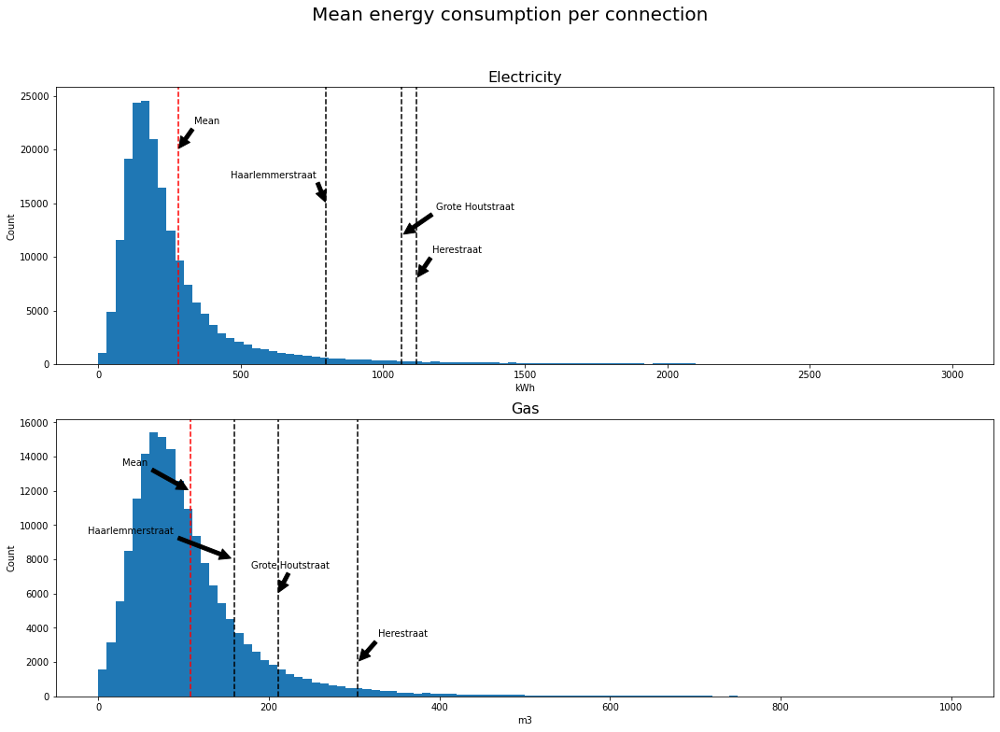

In [13]:
fig, ax = plt.subplots(2,1, figsize=(18, 12))

elec = pd.concat([data[['city', 'street', 'num_connections', 
                        'annual_consume', 'perc_of_active_connections']] for data in imp_elec.values()])
elec['active_connections'] = (elec['num_connections'] * elec['perc_of_active_connections'] / 100).astype(int)
elec = elec.groupby(['city', 'street'], as_index=False).sum()
elec['consume_per_connection'] = elec['annual_consume'] / elec['active_connections']
elec[elec.consume_per_connection < 3000].consume_per_connection.hist(bins=100, ax=ax[0])
ax[0].axvline(x=elec[(elec.street == 'Grote Houtstraat') & 
                     (elec.city=='HAARLEM')].consume_per_connection.values[0], color='k', linestyle='--')
ax[0].axvline(x=elec[(elec.street == 'Haarlemmerstraat') & 
                     (elec.city=='LEIDEN')].consume_per_connection.values[0], color='k', linestyle='--')
ax[0].axvline(x=elec[(elec.street == 'Herestraat') & 
                     (elec.city=='GRONINGEN')].consume_per_connection.values[0], color='k', linestyle='--')
ax[0].axvline(x=elec.consume_per_connection.replace(np.inf, 0).mean(), color='r', linestyle='--')
ax[0].annotate('Mean',
            xy=(elec.replace(np.inf, 0)[elec.consume_per_connection>0].consume_per_connection.mean(), 20000), xycoords='data',
            xytext=(45, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom')
ax[0].annotate('Herestraat',
            xy=(elec[(elec.street == 'Herestraat') & 
                     (elec.city=='GRONINGEN')].consume_per_connection.values[0], 8000), xycoords='data',
            xytext=(70, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom')
ax[0].annotate('Haarlemmerstraat',
            xy=(elec[(elec.street == 'Haarlemmerstraat') & 
                     (elec.city=='LEIDEN')].consume_per_connection.values[0], 15000), xycoords='data',
            xytext=(-10, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom')
ax[0].annotate('Grote Houtstraat',
            xy=(elec[(elec.street == 'Grote Houtstraat') & 
                     (elec.city=='HAARLEM')].consume_per_connection.values[0], 12000), xycoords='data',
            xytext=(120, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom')
ax[0].grid(False)
ax[0].set_title('Electricity', fontsize=16)
ax[0].set_xlabel('kWh')
ax[0].set_ylabel('Count')

gas = pd.concat([data[['city', 'street', 'num_connections', 
                       'annual_consume', 'perc_of_active_connections']] for data in imp_gas.values()])
gas['active_connections'] = (gas['num_connections'] * gas['perc_of_active_connections'] / 100).astype(int)
gas = gas.groupby(['city', 'street'], as_index=False).sum()
gas['consume_per_connection'] = gas['annual_consume'] / gas['active_connections']
gas[gas.consume_per_connection < 1000].consume_per_connection.hist(bins=100, ax=ax[1])
ax[1].axvline(x=gas[(gas.street == 'Grote Houtstraat') & 
                     (gas.city=='HAARLEM')].consume_per_connection.values[0], color='k', linestyle='--')
ax[1].axvline(x=gas[(gas.street == 'Haarlemmerstraat') & 
                     (gas.city=='LEIDEN')].consume_per_connection.values[0], color='k', linestyle='--')
ax[1].axvline(x=gas[(gas.street == 'Herestraat') & 
                     (gas.city=='GRONINGEN')].consume_per_connection.values[0], color='k', linestyle='--')
ax[1].axvline(x=gas.consume_per_connection.replace(np.inf, 0).mean(), color='r', linestyle='--')
ax[1].annotate('Mean',
            xy=(gas.replace(np.inf, 0)[gas.consume_per_connection>0].consume_per_connection.mean(), 12000), xycoords='data',
            xytext=(-45, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom')
ax[1].annotate('Herestraat',
            xy=(gas[(gas.street == 'Herestraat') & 
                     (gas.city=='GRONINGEN')].consume_per_connection.values[0], 2000), xycoords='data',
            xytext=(75, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom')
ax[1].annotate('Haarlemmerstraat',
            xy=(gas[(gas.street == 'Haarlemmerstraat') & 
                     (gas.city=='LEIDEN')].consume_per_connection.values[0], 8000), xycoords='data',
            xytext=(-65, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom')
ax[1].annotate('Grote Houtstraat',
            xy=(gas[(gas.street == 'Grote Houtstraat') & 
                     (gas.city=='HAARLEM')].consume_per_connection.values[0], 6000), xycoords='data',
            xytext=(55, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom')
ax[1].grid(False)
ax[1].set_title('Gas', fontsize=16)
ax[1].set_xlabel('m3')
ax[1].set_ylabel('Count')

fig.suptitle('Mean energy consumption per connection', fontsize=20)
plt.show()

At this point, one may wonder how the previous graphs would look like if we stop studying the *consumption per connection* and focus on the total consumption. The reason why we are taking into account the number of active connections is that these 3 streets are fairly large streets and it would be unfair to compare them with the many tiny streets of the Dutch cities.

However, at this stage, it doesn't hurt to have a look at how unfair the comparison would be and see how the **total energy consumption of the Netherlands in the past 10 years** is distributed and where can we find the 3 streets.

*Note: in the next graphs the mean is calculated without consumptions below 1000 kWh or below 100 m3 of gas*

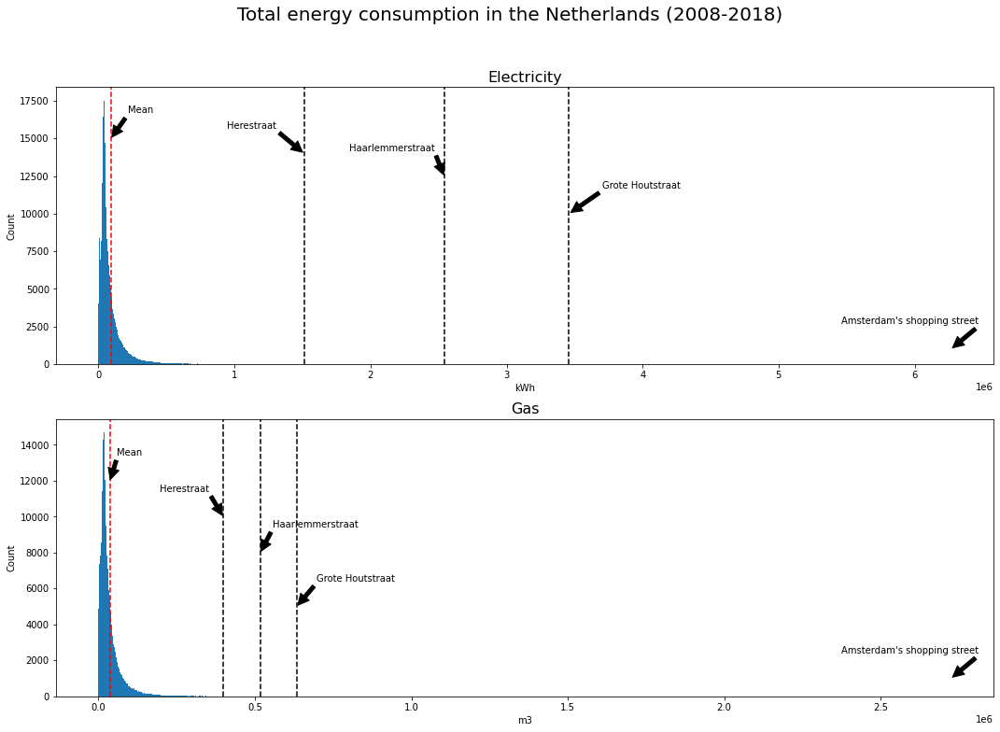

In [14]:
fig, ax = plt.subplots(2,1, figsize=(18, 12))

elec = pd.concat([data[['city', 'street', 'num_connections', 
                        'annual_consume', 'perc_of_active_connections']] for data in imp_elec.values()])
elec = elec.groupby(['city', 'street'], as_index=False).sum()
elec.annual_consume.hist(bins=1000, ax=ax[0])
ax[0].axvline(x=elec[(elec.street == 'Grote Houtstraat') & 
                     (elec.city=='HAARLEM')].annual_consume.values[0], color='k', linestyle='--')
ax[0].axvline(x=elec[(elec.street == 'Haarlemmerstraat') & 
                     (elec.city=='LEIDEN')].annual_consume.values[0], color='k', linestyle='--')
ax[0].axvline(x=elec[(elec.street == 'Herestraat') & 
                     (elec.city=='GRONINGEN')].annual_consume.values[0], color='k', linestyle='--')
ax[0].axvline(x=elec[elec.annual_consume > 1000].annual_consume.mean(), color='r', linestyle='--')
ax[0].annotate('Mean',
            xy=(elec[elec.annual_consume > 1000].annual_consume.mean(), 15000), xycoords='data',
            xytext=(45, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom')
ax[0].annotate('Herestraat',
            xy=(elec[(elec.street == 'Herestraat') & 
                     (elec.city=='GRONINGEN')].annual_consume.values[0], 14000), xycoords='data',
            xytext=(-30, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom')
ax[0].annotate('Haarlemmerstraat',
            xy=(elec[(elec.street == 'Haarlemmerstraat') & 
                     (elec.city=='LEIDEN')].annual_consume.values[0], 12500), xycoords='data',
            xytext=(-10, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom')
ax[0].annotate('Grote Houtstraat',
            xy=(elec[(elec.street == 'Grote Houtstraat') & 
                     (elec.city=='HAARLEM')].annual_consume.values[0], 10000), xycoords='data',
            xytext=(120, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom')
ax[0].annotate('Amsterdam\'s shopping street',
            xy=(elec[(elec.street == 'Keizersgracht') & 
                     (elec.city=='AMSTERDAM')].annual_consume.values[0], 1000), xycoords='data',
            xytext=(30, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom')
ax[0].grid(False)
ax[0].set_title('Electricity', fontsize=16)
ax[0].set_xlabel('kWh')
ax[0].set_ylabel('Count')


gas = pd.concat([data[['city', 'street', 'num_connections', 
                       'annual_consume', 'perc_of_active_connections']] for data in imp_gas.values()])
gas = gas.groupby(['city', 'street'], as_index=False).sum()
gas.annual_consume.hist(bins=1000, ax=ax[1])
ax[1].axvline(x=gas[(gas.street == 'Grote Houtstraat') & 
                     (gas.city=='HAARLEM')].annual_consume.values[0], color='k', linestyle='--')
ax[1].axvline(x=gas[(gas.street == 'Haarlemmerstraat') & 
                     (gas.city=='LEIDEN')].annual_consume.values[0], color='k', linestyle='--')
ax[1].axvline(x=gas[(gas.street == 'Herestraat') & 
                     (gas.city=='GRONINGEN')].annual_consume.values[0], color='k', linestyle='--')
ax[1].axvline(x=gas[gas.annual_consume > 100].annual_consume.mean(), color='r', linestyle='--')
ax[1].annotate('Mean',
            xy=(gas[gas.annual_consume > 100].annual_consume.mean(), 12000), xycoords='data',
            xytext=(35, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom')
ax[1].annotate('Herestraat',
            xy=(gas[(gas.street == 'Herestraat') & 
                     (gas.city=='GRONINGEN')].annual_consume.values[0], 10000), xycoords='data',
            xytext=(-15, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom')
ax[1].annotate('Haarlemmerstraat',
            xy=(gas[(gas.street == 'Haarlemmerstraat') & 
                     (gas.city=='LEIDEN')].annual_consume.values[0], 8000), xycoords='data',
            xytext=(105, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom')
ax[1].annotate('Grote Houtstraat',
            xy=(gas[(gas.street == 'Grote Houtstraat') & 
                     (gas.city=='HAARLEM')].annual_consume.values[0], 5000), xycoords='data',
            xytext=(105, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom')
ax[1].annotate('Amsterdam\'s shopping street',
            xy=(gas[(gas.street == 'Keizersgracht') & 
                     (gas.city=='AMSTERDAM')].annual_consume.values[0], 1000), xycoords='data',
            xytext=(30, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom')
ax[1].grid(False)
ax[1].set_title('Gas', fontsize=16)
ax[1].set_xlabel('m3')
ax[1].set_ylabel('Count')

fig.suptitle('Total energy consumption in the Netherlands (2008-2018)', fontsize=20)
plt.show()

In [16]:
elec.head()

,city,street,num_connections,annual_consume,perc_of_active_connections
0,'S GRAVENHAGE,1e Van der Kunstraat,17.0,7717.0,17.65
1,'S GRAVENHAGE,Ambachtsgaarde,66.0,9533.0,100.00
2,'S GRAVENHAGE,Hindersteynstraat,40.0,8964.0,185.00
3,'S GRAVENHAGE,Johanna Triebelspad,49.0,13617.0,281.62
4,'S GRAVENHAGE,John Steinbecklaan,10.0,3539.0,0.00


In [29]:
for year in np.arange(2009, 2020):
    fig, ax = plt.subplots(2,2, figsize=(18, 12))
    yr_elec = elec[elec.year==str(year)].copy()
    yr_gas = gas[gas.year==str(year)].copy()

    yr_elec.annual_consume.hist(bins=1000, ax=ax[0][0])
    yr_elec.active_connections.hist(bins=1000, ax=ax[0][1])
    yr_gas.annual_consume.hist(bins=1000, ax=ax[1][0])
    yr_gas.active_connections.hist(bins=1000, ax=ax[1][1])

    ax[0][0].set_xlim(-10000, 400000)
    ax[0][1].set_xlim(-10, 500)
    ax[1][0].set_xlim(-2500, 80000)
    ax[1][1].set_xlim(-10, 500)

    ax[0][0].set_ylim(0, 18000)
    ax[0][1].set_ylim(0, 15000)
    ax[1][0].set_ylim(0, 15000)
    ax[1][1].set_ylim(0, 12000)

    ax[0][0].axvline(x=yr_elec[(yr_elec.street == 'Grote Houtstraat') & 
                         (yr_elec.city=='HAARLEM')].annual_consume.values[0], color='lime', linestyle='--')
    ax[0][0].axvline(x=yr_elec[(yr_elec.street == 'Haarlemmerstraat') & 
                         (yr_elec.city=='LEIDEN')].annual_consume.values[0], color='darkviolet', linestyle='--')
    ax[0][0].axvline(x=yr_elec[(yr_elec.street == 'Herestraat') & 
                         (yr_elec.city=='GRONINGEN')].annual_consume.values[0], color='k', linestyle='--')
    ax[0][0].axvline(x=yr_elec[yr_elec.annual_consume > 1000].annual_consume.mean(), color='r', linestyle='--')

    ax[0][1].axvline(x=yr_elec[(yr_elec.street == 'Grote Houtstraat') & 
                         (yr_elec.city=='HAARLEM')].active_connections.values[0], color='lime', linestyle='--')
    ax[0][1].axvline(x=yr_elec[(yr_elec.street == 'Haarlemmerstraat') & 
                         (yr_elec.city=='LEIDEN')].active_connections.values[0], color='darkviolet', linestyle='--')
    ax[0][1].axvline(x=yr_elec[(yr_elec.street == 'Herestraat') & 
                         (yr_elec.city=='GRONINGEN')].active_connections.values[0], color='k', linestyle='--')
    ax[0][1].axvline(x=yr_elec[yr_elec.annual_consume > 1000].active_connections.mean(), color='r', linestyle='--')

    ax[1][0].axvline(x=yr_gas[(yr_gas.street == 'Grote Houtstraat') & 
                         (yr_gas.city=='HAARLEM')].annual_consume.values[0], color='lime', linestyle='--')
    ax[1][0].axvline(x=yr_gas[(yr_gas.street == 'Haarlemmerstraat') & 
                         (yr_gas.city=='LEIDEN')].annual_consume.values[0], color='darkviolet', linestyle='--')
    ax[1][0].axvline(x=yr_gas[(yr_gas.street == 'Herestraat') & 
                         (yr_gas.city=='GRONINGEN')].annual_consume.values[0], color='k', linestyle='--')
    ax[1][0].axvline(x=yr_gas[yr_gas.annual_consume > 1000].annual_consume.mean(), color='r', linestyle='--')

    ax[1][1].axvline(x=yr_gas[(yr_gas.street == 'Grote Houtstraat') & 
                         (yr_gas.city=='HAARLEM')].active_connections.values[0], color='lime', linestyle='--')
    ax[1][1].axvline(x=yr_gas[(yr_gas.street == 'Haarlemmerstraat') & 
                         (yr_gas.city=='LEIDEN')].active_connections.values[0], color='darkviolet', linestyle='--')
    ax[1][1].axvline(x=yr_gas[(yr_gas.street == 'Herestraat') & 
                         (yr_gas.city=='GRONINGEN')].active_connections.values[0], color='k', linestyle='--')
    ax[1][1].axvline(x=yr_gas[yr_gas.annual_consume > 100].active_connections.mean(), color='r', linestyle='--')

    ax[0][0].set_title('Electricity consumption '+str(year), fontsize=14)
    ax[0][1].set_title('Number of active electricity connections '+str(year), fontsize=14)
    ax[1][0].set_title('Gas consumption '+str(year), fontsize=14)
    ax[1][1].set_title('Number of active gas connections '+str(year), fontsize=14)

    ax[0][0].grid(False)
    ax[0][1].grid(False)
    ax[1][0].grid(False)
    ax[1][1].grid(False)

    fig.savefig('distributions_'+str(year)+'.png')
    plt.close()

In [30]:
import glob
files = glob.glob('*.png')
files = np.sort(files)

# make a copy of each image to slow down gif by factor 2
from shutil import copyfile
for file in files:
    copyfile(file, file.split('.')[0]+'_1.png')
    copyfile(file, file.split('.')[0]+'_2.png')
    copyfile(file, file.split('.')[0]+'_3.png')
    copyfile(file, file.split('.')[0]+'_4.png')
    if '2019' in file:
        copyfile(file, file.split('.')[0]+'_5.png')
        copyfile(file, file.split('.')[0]+'_6.png')
        copyfile(file, file.split('.')[0]+'_7.png')
        copyfile(file, file.split('.')[0]+'_8.png')
files = glob.glob('*.png')
files = np.sort(files)
images = []
for file in files:
    # imageio.imread(file) creates a numpy matrix array
    # In this case a 200 x 200 matrix for every file, since the files are 200 x 200 pixels.
    images.append(imageio.imread(file))
    print(file)
imageio.mimsave('energy-distribution.gif', images)

distributions_2009.png
distributions_2009_1.png
distributions_2009_2.png
distributions_2009_3.png
distributions_2009_4.png
distributions_2010.png
distributions_2010_1.png
distributions_2010_2.png
distributions_2010_3.png
distributions_2010_4.png
distributions_2011.png
distributions_2011_1.png
distributions_2011_2.png
distributions_2011_3.png
distributions_2011_4.png
distributions_2012.png
distributions_2012_1.png
distributions_2012_2.png
distributions_2012_3.png
distributions_2012_4.png
distributions_2013.png
distributions_2013_1.png
distributions_2013_2.png
distributions_2013_3.png
distributions_2013_4.png
distributions_2014.png
distributions_2014_1.png
distributions_2014_2.png
distributions_2014_3.png
distributions_2014_4.png
distributions_2015.png
distributions_2015_1.png
distributions_2015_2.png
distributions_2015_3.png
distributions_2015_4.png
distributions_2016.png
distributions_2016_1.png
distributions_2016_2.png
distributions_2016_3.png
distributions_2016_4.png
distributions_20

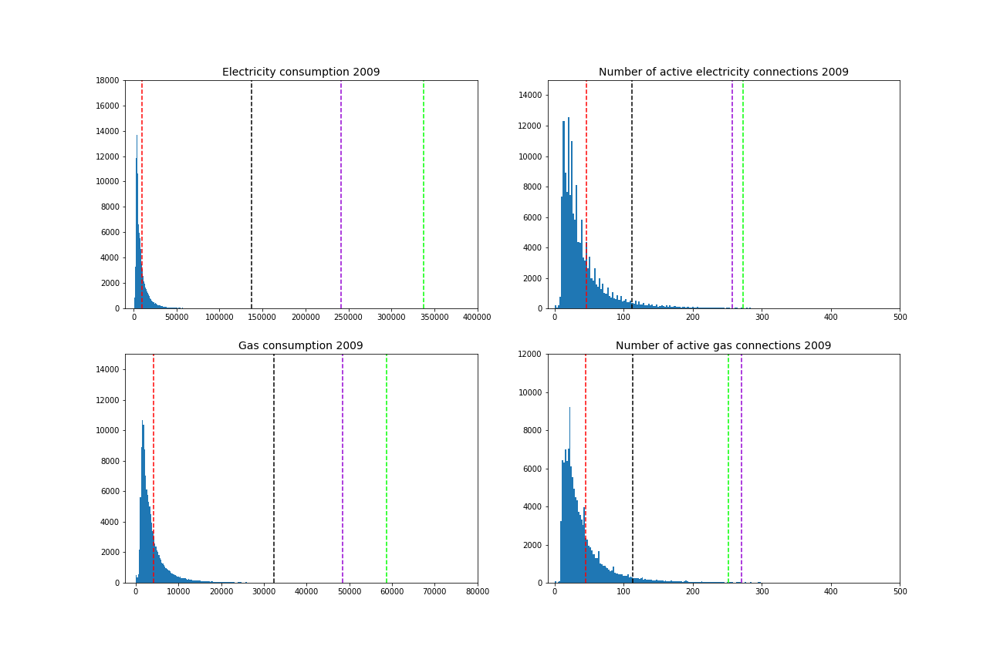

In [31]:
from IPython.display import Image
Image("energy-distribution.gif")

This graph shows also why I didn't consider the shopping street of Amsterdam (whose shops keep their door open too): **it is the street with the highest energy consumption of the country**. Please keep in mind that in these data are present industrial facilities too, including, for example, the production facilities of Heineken.

# Is it about the shopping or is it about the door?

One doubt easily arises here: the city average is based mostly on houses and a street with a large number of shops is naturally consuming more energy. It is fair to admit that a shop can consume more than a house (larger spaces to warm up or cool down, more lights), does this justify an average consumption 500% higher?

Let's take Leiden, not far from Haarlemmerstraat there are 2 streets with 2 fairly big (for Dutch standards) supermarkets, a few other shops, and a few houses. I do expect to see a high energy consumption because the supermarkets come with a 2 story parking lot, they have refrigerators (something not much present in Harlemmerstraat since the shops are mostly of clothes and mobile phones), they are open more than anything else in the city (12/7 at least). There is one big difference they (as well as the other shops in their streets) have multiple doors that are not constantly open.

Here is what their energy consumption looks like

In [19]:
elec_gas_comparison(imp_elec, imp_gas, "LEIDEN", 'Korevaarstraat')

,city,street,year,num_connections_e,active_connections_e,annual_consume_e,consume_per_connection_e,city_num_connections_e,city_active_connections_e,city_annual_consume_e,city_consume_per_connection_e,excess_perc_e,num_connections_g,active_connections_g,annual_consume_g,consume_per_connection_g,city_num_connections_g,city_active_connections_g,city_annual_consume_g,city_consume_per_connection_g,excess_perc_g
0,LEIDEN,Korevaarstraat,2008,87.0,80.0,24042.0,300.525000,56390.0,54145.0,10777534.0,199.049478,150.980049,78.0,74.0,6075.0,82.094595,48823.0,48228.0,3825461.0,79.320333,103.497542
1,LEIDEN,Korevaarstraat,2009,87.0,80.0,22407.0,280.087500,56770.0,54569.0,10863563.0,199.079386,140.691362,78.0,75.0,5866.0,78.213333,49020.0,48346.0,3821945.0,79.054007,98.936584
2,LEIDEN,Korevaarstraat,2010,87.0,80.0,20174.0,252.175000,57417.0,54539.0,10872895.0,199.359999,126.492276,78.0,75.0,5343.0,71.240000,49167.0,48190.0,3793892.0,78.727786,90.489018
3,LEIDEN,Korevaarstraat,2011,87.0,80.0,20474.0,255.925000,57941.0,55040.0,10776301.0,195.790352,130.713795,78.0,75.0,5441.0,72.546667,49385.0,48197.0,3691128.0,76.584186,94.727999
4,LEIDEN,Korevaarstraat,2012,87.0,80.0,18623.0,232.787500,58494.0,55385.0,10665824.0,192.576040,120.880822,78.0,75.0,5829.0,77.720000,49613.0,48241.0,3553615.0,73.663792,105.506379
5,LEIDEN,Korevaarstraat,2013,89.0,80.0,19174.0,239.675000,58972.0,55318.0,10670046.0,192.885607,124.257587,78.0,75.0,8030.0,107.066667,49821.0,48292.0,3577997.0,74.090885,144.507205
6,LEIDEN,Korevaarstraat,2014,91.0,81.0,18981.0,234.333333,59998.0,55457.0,10421468.0,187.919794,124.698590,78.0,75.0,6017.0,80.226667,49987.0,48043.0,3433034.0,71.457528,112.271820
7,LEIDEN,Korevaarstraat,2015,91.0,81.0,17699.0,218.506173,61349.0,56637.0,10278028.0,181.471971,120.407671,78.0,75.0,5878.0,78.373333,50552.0,48319.0,3356919.0,69.474099,112.809427
8,LEIDEN,Korevaarstraat,2016,91.0,83.0,17805.0,214.518072,62465.0,57744.0,10073943.0,174.458697,122.962097,79.0,75.0,6054.0,80.720000,51071.0,48758.0,3328105.0,68.257619,118.257860
9,LEIDEN,Korevaarstraat,2017,91.0,83.0,16623.0,200.277108,63460.0,58638.0,9952011.0,169.719482,118.004784,80.0,75.0,6155.0,82.066667,51568.0,48979.0,3300809.0,67.392331,121.774488


In [20]:
elec_gas_comparison(imp_elec, imp_gas, "LEIDEN", 'Hooigracht')

,city,street,year,num_connections_e,active_connections_e,annual_consume_e,consume_per_connection_e,city_num_connections_e,city_active_connections_e,city_annual_consume_e,city_consume_per_connection_e,excess_perc_e,num_connections_g,active_connections_g,annual_consume_g,consume_per_connection_g,city_num_connections_g,city_active_connections_g,city_annual_consume_g,city_consume_per_connection_g,excess_perc_g
0,LEIDEN,Hooigracht,2008,142.0,136.0,52823.0,388.404412,56390.0,54145.0,10777534.0,199.049478,195.129580,128.0,127.0,21669.0,170.622047,48823.0,48228.0,3825461.0,79.320333,215.105058
1,LEIDEN,Hooigracht,2009,142.0,134.0,54808.0,409.014925,56770.0,54569.0,10863563.0,199.079386,205.453178,128.0,127.0,21632.0,170.330709,49020.0,48346.0,3821945.0,79.054007,215.461197
2,LEIDEN,Hooigracht,2010,142.0,134.0,52861.0,394.485075,57417.0,54539.0,10872895.0,199.359999,197.875740,128.0,127.0,21790.0,171.574803,49167.0,48190.0,3793892.0,78.727786,217.934242
3,LEIDEN,Hooigracht,2011,142.0,134.0,50545.0,377.201493,57941.0,55040.0,10776301.0,195.790352,192.655812,128.0,125.0,21368.0,170.944000,49385.0,48197.0,3691128.0,76.584186,223.210573
4,LEIDEN,Hooigracht,2012,150.0,142.0,49330.0,347.394366,58494.0,55385.0,10665824.0,192.576040,180.393348,135.0,132.0,19187.0,145.356061,49613.0,48241.0,3553615.0,73.663792,197.323619
5,LEIDEN,Hooigracht,2013,149.0,141.0,48334.0,342.794326,58972.0,55318.0,10670046.0,192.885607,177.718976,135.0,132.0,19720.0,149.393939,49821.0,48292.0,3577997.0,74.090885,201.636058
6,LEIDEN,Hooigracht,2014,151.0,142.0,47220.0,332.535211,59998.0,55457.0,10421468.0,187.919794,176.955926,136.0,132.0,19480.0,147.575758,49987.0,48043.0,3433034.0,71.457528,206.522339
7,LEIDEN,Hooigracht,2015,151.0,141.0,44351.0,314.546099,61349.0,56637.0,10278028.0,181.471971,173.330404,136.0,131.0,19097.0,145.778626,50552.0,48319.0,3356919.0,69.474099,209.831617
8,LEIDEN,Hooigracht,2016,156.0,139.0,45127.0,324.654676,62465.0,57744.0,10073943.0,174.458697,186.092572,139.0,131.0,19218.0,146.702290,51071.0,48758.0,3328105.0,68.257619,214.924417
9,LEIDEN,Hooigracht,2017,159.0,147.0,44728.0,304.272109,63460.0,58638.0,9952011.0,169.719482,179.279423,142.0,135.0,19114.0,141.585185,51568.0,48979.0,3300809.0,67.392331,210.090944


The excess of energy consumption for these 2 streets is, as expected, well above the city average but still below 200% of the city average. In other words, **they consume less than half of Haarlemmerstraat just by having their doors closed** and despite having machines that consume way more energy.

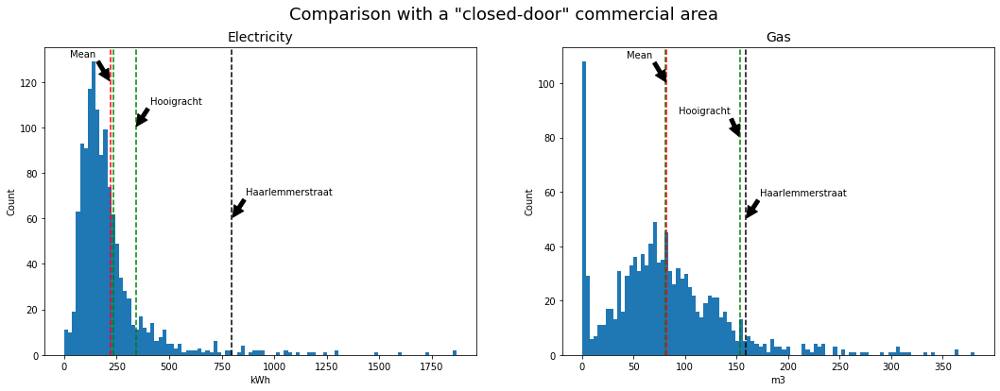

In [21]:
fig, ax = plt.subplots(1,2, figsize=(18, 6))

test = consume_city_distribution(imp_elec, 'LEIDEN')
test[test.consume_per_connection.replace(np.inf, 0) < 2000].consume_per_connection.replace(np.inf, 0).hist(bins=100, ax=ax[0])
ax[0].axvline(x=test[test.street == 'Haarlemmerstraat'].consume_per_connection.values[0], color='k', linestyle='--')
ax[0].axvline(x=test[test.street == 'Hooigracht'].consume_per_connection.values[0], color='g', linestyle='--')
ax[0].axvline(x=test[test.street == 'Korevaarstraat'].consume_per_connection.values[0], color='g', linestyle='--')
ax[0].axvline(x=test.consume_per_connection.replace(np.inf, 0).mean(), color='r', linestyle='--')
ax[0].annotate('Haarlemmerstraat',
            xy=(test[test.street == 'Haarlemmerstraat'].consume_per_connection.values[0], 60), 
            xycoords='data', xytext=(15, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05))
ax[0].annotate('Hooigracht',
            xy=(test[test.street == 'Hooigracht'].consume_per_connection.values[0], 100), 
            xycoords='data', xytext=(15, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05))
ax[0].annotate('Mean',
            xy=(test.replace(np.inf, 0)[test.consume_per_connection>0].consume_per_connection.mean(), 120), xycoords='data',
            xytext=(-15, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom')
ax[0].grid(False)
ax[0].set_title('Electricity', fontsize=14)
ax[0].set_xlabel('kWh')
ax[0].set_ylabel('Count')

test = consume_city_distribution(imp_gas, 'LEIDEN')
test[test.consume_per_connection.replace(np.inf, 0) < 400].consume_per_connection.replace(np.inf, 0).hist(bins=100, ax=ax[1])
ax[1].axvline(x=test[test.street == 'Haarlemmerstraat'].consume_per_connection.values[0], color='k', linestyle='--')
ax[1].axvline(x=test[test.street == 'Hooigracht'].consume_per_connection.values[0], color='g', linestyle='--')
ax[1].axvline(x=test[test.street == 'Korevaarstraat'].consume_per_connection.values[0], color='g', linestyle='--')
ax[1].axvline(x=test.consume_per_connection.replace(np.inf, 0).mean(), color='r', linestyle='--')
ax[1].annotate('Haarlemmerstraat',
            xy=(test[test.street == 'Haarlemmerstraat'].consume_per_connection.values[0], 50), 
            xycoords='data', xytext=(15, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05))
ax[1].annotate('Hooigracht',
            xy=(test[test.street == 'Hooigracht'].consume_per_connection.values[0], 80), 
            xycoords='data', xytext=(-65, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05))
ax[1].annotate('Mean',
            xy=(test.replace(np.inf, 0)[test.consume_per_connection>0].consume_per_connection.mean(), 100), xycoords='data',
            xytext=(-15, 25), textcoords='offset points',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom')
ax[1].grid(False)
ax[1].set_title('Gas', fontsize=14)
ax[1].set_xlabel('m3')
ax[1].set_ylabel('Count')

fig.suptitle('Comparison with a "closed-door" commercial area', fontsize=18)
plt.show()

It is interesting to notice how Haarlemmerstraat burns so much more electricity than the other two streets (with Korevaarstraat being almost perfectly aligned with the city mean) and how, looking at gas consumption, Hooigracht and Haarlemmerstraat are essentially the same. One reason could be that the air conditioning of these commercial places is fueled by electricity and a constantly open door can make a lot of difference while gas consumption (the main source of heat for houses, especially for old houses as the one in that area). In the absence of further information, everything else would be pure speculation.

# What else consume as much energy?

At last, we can look for similar streets either by energy consumption or number of connections.

### Work in progress...

In [22]:
elec = consume_by_street(imp_elec)
gas = consume_by_street(imp_gas)

In [23]:
test = elec[((elec.city == 'LEIDEN') & (elec.street == 'Haarlemmerstraat')) | 
     ((elec.city == 'HAARLEM') & (elec.street == 'Grote Houtstraat')) |  
     ((elec.city == 'GRONINGEN') & (elec.street == 'Herestraat'))].copy()
print('----- Electricity ------')
print('Active connections: ')
print(f'\t Min: {test.active_connections.min()}')
print(f'\t Max: {test.active_connections.max()}')
print('Annual consume: ')
print(f'\t Min: {test.annual_consume.min()}')
print(f'\t Max: {test.annual_consume.max()}')
print('Consume per connections: ')
print(f'\t Min: {test.consume_per_connection.min()}')
print(f'\t Max: {test.consume_per_connection.max()}')
test = gas[((gas.city == 'LEIDEN') & (gas.street == 'Haarlemmerstraat')) | 
     ((gas.city == 'HAARLEM') & (gas.street == 'Grote Houtstraat')) |  
     ((gas.city == 'GRONINGEN') & (gas.street == 'Herestraat'))].copy()
print('----- Gas ------')
print('Active connections: ')
print(f'\t Min: {test.active_connections.min()}')
print(f'\t Max: {test.active_connections.max()}')
print('Annual consume: ')
print(f'\t Min: {test.annual_consume.min()}')
print(f'\t Max: {test.annual_consume.max()}')
print('Consume per connections: ')
print(f'\t Min: {test.consume_per_connection.min()}')
print(f'\t Max: {test.consume_per_connection.max()}')

----- Electricity ------
Active connections: 
	 Min: 112.0
	 Max: 283.0
Annual consume: 
	 Min: 121425.0
	 Max: 337248.0
Consume per connections: 
	 Min: 643.3
	 Max: 1339.121739130435
----- Gas ------
Active connections: 
	 Min: 113.0
	 Max: 278.0
Annual consume: 
	 Min: 32346.0
	 Max: 59178.0
Consume per connections: 
	 Min: 143.0
	 Max: 347.82456140350877


Interestingly, the only street consuming more energy with less connections than our 3 streets is a huge commercial area in the north of Eindhoven

In [24]:
elec[(elec.annual_consume > 337248) & (elec.active_connections < 283) ] 

,city,street,year,num_connections,active_connections,annual_consume,consume_per_connection
570896,EINDHOVEN,Creonlaan,2010,33.0,27.0,429754.35,15916.827778
570897,EINDHOVEN,Creonlaan,2011,33.0,25.0,431394.95,17255.798000
570898,EINDHOVEN,Creonlaan,2012,32.0,25.0,431501.70,17260.068000
1530811,SON EN BREUGEL,Ekkersrijt,2017,231.0,231.0,443231.86,1918.752641
1530812,SON EN BREUGEL,Ekkersrijt,2018,235.0,235.0,448160.00,1907.063830
1530813,SON EN BREUGEL,Ekkersrijt,2019,236.0,236.0,434933.63,1842.939110


While we have 112 streets that consumed more than the lowest consumption of the main characters of our tale (with fewer connections than the maximum number of connections in our streets). I am still looking for one of them that is not a shopping street.

In [25]:
test = elec[(elec.annual_consume > 121425) & (elec.active_connections < 283) ][['city', 'street']].drop_duplicates()
print(test.shape[0])
test.sample(10)

127


,city,street
912253,HOORN NH,Grote Noord
1482979,SCHIJNDEL,Hoofdstraat
316210,BEVERWIJK,Breestraat
894702,HOOFDDORP,Kruisweg
961158,KATWIJK ZH,Boulevard
1418552,ROTTERDAM,Coolsingel
26914,'S-GRAVENHAGE,Strandweg
1649565,UTRECHT,Maliebaan
395931,BUSSUM,Huizerweg
713396,GRONINGEN,Herestraat


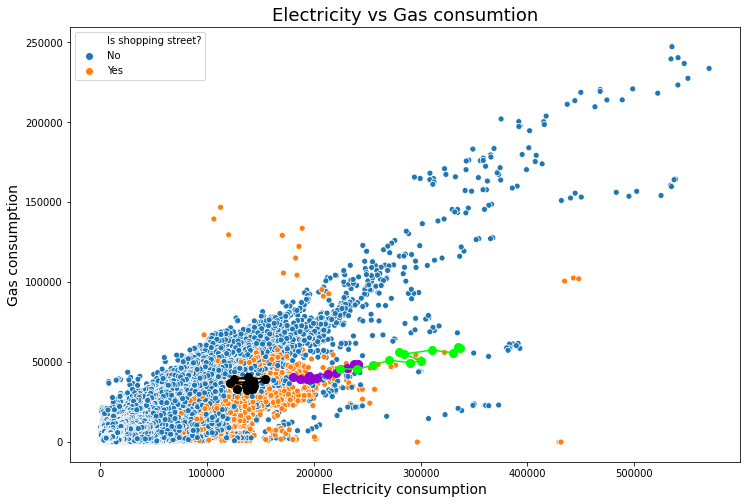

In [26]:
el_con = elec.copy()
ga_con = gas.copy()

el_con.columns = ['city', 'street', 'year'] + \
                ['el_'+col for col in el_con.columns if col not in ['city', 'street', 'year']]
ga_con.columns = ['city', 'street', 'year'] + \
                ['ga_'+col for col in ga_con.columns if col not in ['city', 'street', 'year']]

tot_con = pd.merge(el_con, ga_con, on=['city', 'street', 'year'])

test = elec[(elec.annual_consume > 121425) & (elec.active_connections <= 283) ][['city', 'street']].drop_duplicates()

test['Is shopping street?'] = 'Yes'

tot_con = pd.merge(tot_con, test, on=['city', 'street'], how='left').fillna('No')

plt.figure(figsize=(12,8))
ax = sns.scatterplot(x='el_annual_consume', y='ga_annual_consume', hue='Is shopping street?', data=tot_con)
ax.set_title('Electricity vs Gas consumtion', fontsize=18)
ax.set_xlabel('Electricity consumption', fontsize=14)
ax.set_ylabel('Gas consumption', fontsize=14)

ax.plot(tot_con[(tot_con.city=='GRONINGEN') & (tot_con.street=='Herestraat')].el_annual_consume, 
            tot_con[(tot_con.city=='GRONINGEN') & (tot_con.street=='Herestraat')].ga_annual_consume, 
            color='k', marker='o', markersize=8)
ax.plot(tot_con[(tot_con.city=='LEIDEN') & (tot_con.street=='Haarlemmerstraat')].el_annual_consume, 
        tot_con[(tot_con.city=='LEIDEN') & (tot_con.street=='Haarlemmerstraat')].ga_annual_consume, 
        color='darkviolet', marker='o', markersize=8)
ax.plot(tot_con[(tot_con.city=='HAARLEM') & (tot_con.street=='Grote Houtstraat')].el_annual_consume, 
        tot_con[(tot_con.city=='HAARLEM') & (tot_con.street=='Grote Houtstraat')].ga_annual_consume, 
        color='lime', marker='o', markersize=8)
plt.show()

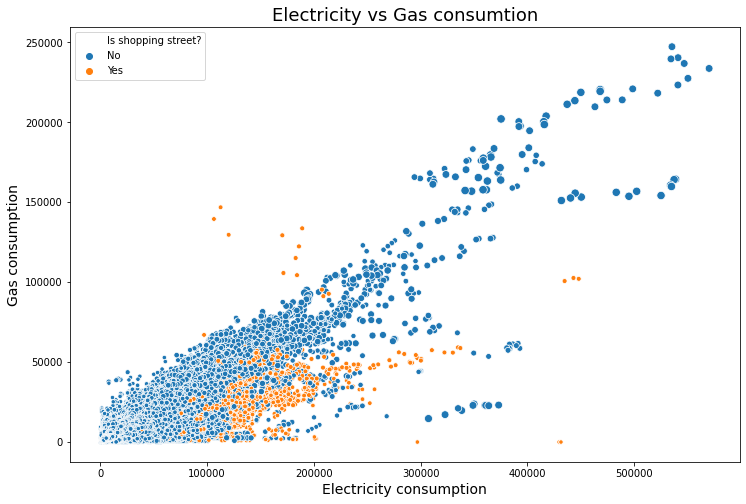

In [27]:
el_con = elec.copy()
ga_con = gas.copy()

el_con.columns = ['city', 'street', 'year'] + \
                ['el_'+col for col in el_con.columns if col not in ['city', 'street', 'year']]
ga_con.columns = ['city', 'street', 'year'] + \
                ['ga_'+col for col in ga_con.columns if col not in ['city', 'street', 'year']]

tot_con = pd.merge(el_con, ga_con, on=['city', 'street', 'year'])

test = elec[(elec.annual_consume > 121425) & (elec.active_connections <= 283) ][['city', 'street']].drop_duplicates()

test['Is shopping street?'] = 'Yes'

tot_con = pd.merge(tot_con, test, on=['city', 'street'], how='left').fillna('No')

tot_con['tot_connections'] = tot_con['el_active_connections'] + tot_con['ga_active_connections']

plt.figure(figsize=(12,8))
ax = sns.scatterplot(x='el_annual_consume', y='ga_annual_consume', size='tot_connections',
                     hue='Is shopping street?', data=tot_con)
ax.set_title('Electricity vs Gas consumtion', fontsize=18)
ax.set_xlabel('Electricity consumption', fontsize=14)
ax.set_ylabel('Gas consumption', fontsize=14)
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles[0:3], labels[0:3])
plt.show()

In [12]:
handles, labels = ax.get_legend_handles_labels()

labels

['Is shopping street?',
 'No',
 'Yes',
 'tot_connections',
 '0.0',
 '2000.0',
 '4000.0',
 '6000.0']

In [29]:
tot_con[(tot_con.el_annual_consume>300000) & (tot_con.ga_annual_consume < 40000)]

,city,street,year,el_num_connections,el_active_connections,el_annual_consume,el_consume_per_connection,ga_num_connections,ga_active_connections,ga_annual_consume,ga_consume_per_connection,Is shopping street?
1404918,ZEIST,Laan van Vollenhove,2008,2187.0,2159.0,363674.0,168.446,1473.0,1414.0,22898.0,16.1938,No
1404919,ZEIST,Laan van Vollenhove,2009,2190.0,2162.0,361648.0,167.275,1474.0,1415.0,22898.0,16.1823,No
1404920,ZEIST,Laan van Vollenhove,2010,2200.0,2172.0,360269.0,165.87,1476.0,1417.0,22946.0,16.1934,No
1404921,ZEIST,Laan van Vollenhove,2011,2204.0,2176.0,361016.0,165.908,1477.0,1419.0,22947.0,16.1712,No
1404922,ZEIST,Laan van Vollenhove,2012,2200.0,2166.0,373131.0,172.267,1478.0,1420.0,23121.0,16.2824,No
1404923,ZEIST,Laan van Vollenhove,2013,2208.0,2163.0,363839.0,168.21,1479.0,1422.0,22734.0,15.9873,No
1404924,ZEIST,Laan van Vollenhove,2014,2216.0,2176.0,350147.0,160.913,1481.0,1421.0,23806.0,16.753,No
1404925,ZEIST,Laan van Vollenhove,2015,2225.0,2180.0,349086.0,160.131,1482.0,1415.0,22928.0,16.2035,No
1404926,ZEIST,Laan van Vollenhove,2016,2228.0,2179.0,338530.0,155.36,1482.0,1410.0,19707.0,13.9766,No
1404927,ZEIST,Laan van Vollenhove,2017,2223.0,2172.0,322916.0,148.672,1482.0,1419.0,17127.0,12.0698,No


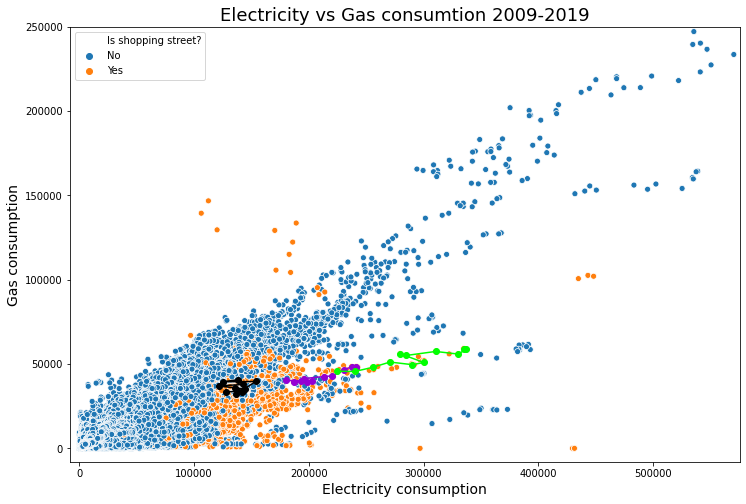

In [39]:
for year in np.arange(2009, 2020):
    yr_elec = elec[elec.year==str(year)].copy()
    yr_gas = gas[gas.year==str(year)].copy()
    
    yr_elec.columns = ['city', 'street', 'year'] + \
                ['el_'+col for col in yr_elec.columns if col not in ['city', 'street', 'year']]
    yr_gas.columns = ['city', 'street', 'year'] + \
                ['ga_'+col for col in yr_gas.columns if col not in ['city', 'street', 'year']]

    
    test = yr_elec[(yr_elec.el_annual_consume > 120000) & 
                   (yr_elec.el_active_connections <= 300) ][['city', 'street', 'year']].drop_duplicates()

    test['Is shopping street?'] = 'Yes'
    
    tot_con = pd.merge(yr_elec, yr_gas, on=['city', 'street', 'year'])

    tot_con = pd.merge(tot_con, test, on=['city', 'street', 'year'], how='left').fillna('No')

    plt.figure(figsize=(12,8))
    ax = sns.scatterplot(x='el_annual_consume', y='ga_annual_consume', 
                         hue='Is shopping street?', data=tot_con, legend=False)
    ax.set_title('Electricity vs Gas consumtion '+ str(year), fontsize=18)
    ax.set_xlabel('Electricity consumption', fontsize=14)
    ax.set_ylabel('Gas consumption', fontsize=14)
    ax.set_ylim(-8000,250000)
    ax.set_xlim(-8000, 575310)
    
    str_tot = (tot_con['Is shopping street?'] == 'Yes').sum()
    textstr = f'Comparable streets: {str_tot}'
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    ax.text(0.02, 0.90, textstr, transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
    
    ax.plot(tot_con[(tot_con.city=='GRONINGEN') & (tot_con.street=='Herestraat')].el_annual_consume, 
            tot_con[(tot_con.city=='GRONINGEN') & (tot_con.street=='Herestraat')].ga_annual_consume, 
            color='k', marker='o', markersize=8)
    ax.plot(tot_con[(tot_con.city=='LEIDEN') & (tot_con.street=='Haarlemmerstraat')].el_annual_consume, 
            tot_con[(tot_con.city=='LEIDEN') & (tot_con.street=='Haarlemmerstraat')].ga_annual_consume, 
            color='darkviolet', marker='o', markersize=8)
    ax.plot(tot_con[(tot_con.city=='HAARLEM') & (tot_con.street=='Grote Houtstraat')].el_annual_consume, 
            tot_con[(tot_con.city=='HAARLEM') & (tot_con.street=='Grote Houtstraat')].ga_annual_consume, 
            color='lime', marker='o', markersize=8)

    plt.savefig('elec_v_gas_'+str(year)+'.png')
    plt.close()
    
tot_con = pd.merge(el_con, ga_con, on=['city', 'street', 'year'])

test = elec[(elec.annual_consume > 120000) & (elec.active_connections <= 300) ][['city', 'street']].drop_duplicates()

test['Is shopping street?'] = 'Yes'

tot_con = pd.merge(tot_con, test, on=['city', 'street'], how='left').fillna('No')

plt.figure(figsize=(12,8))
ax = sns.scatterplot(x='el_annual_consume', y='ga_annual_consume', hue='Is shopping street?', data=tot_con)
ax.set_title('Electricity vs Gas consumtion 2009-2019', fontsize=18)
ax.set_xlabel('Electricity consumption', fontsize=14)
ax.set_ylabel('Gas consumption', fontsize=14)
ax.set_ylim(-8000,250000)
ax.set_xlim(-8000, 575310)

ax.plot(tot_con[(tot_con.city=='GRONINGEN') & (tot_con.street=='Herestraat')].el_annual_consume, 
            tot_con[(tot_con.city=='GRONINGEN') & (tot_con.street=='Herestraat')].ga_annual_consume, 
            color='k', marker='o', markersize=6)
ax.plot(tot_con[(tot_con.city=='LEIDEN') & (tot_con.street=='Haarlemmerstraat')].el_annual_consume, 
        tot_con[(tot_con.city=='LEIDEN') & (tot_con.street=='Haarlemmerstraat')].ga_annual_consume, 
        color='darkviolet', marker='o', markersize=6)
ax.plot(tot_con[(tot_con.city=='HAARLEM') & (tot_con.street=='Grote Houtstraat')].el_annual_consume, 
        tot_con[(tot_con.city=='HAARLEM') & (tot_con.street=='Grote Houtstraat')].ga_annual_consume, 
        color='lime', marker='o', markersize=6)
plt.savefig('elec_v_gas_2019.png')
plt.show()

In [40]:
import glob
files = glob.glob('*.png')
files = np.sort(files)

# make a copy of each image to slow down gif by factor 2
from shutil import copyfile
for file in files:
    copyfile(file, file.split('.')[0]+'_1.png')
    copyfile(file, file.split('.')[0]+'_2.png')
    copyfile(file, file.split('.')[0]+'_3.png')
    copyfile(file, file.split('.')[0]+'_4.png')
    copyfile(file, file.split('.')[0]+'_5.png')
    if '2019' in file:
        copyfile(file, file.split('.')[0]+'_6.png')
        copyfile(file, file.split('.')[0]+'_7.png')
        copyfile(file, file.split('.')[0]+'_8.png')
        copyfile(file, file.split('.')[0]+'_9.png')
        copyfile(file, file.split('.')[0]+'_10.png')
files = glob.glob('*.png')
files = np.sort(files)
images = []
for file in files:
    # imageio.imread(file) creates a numpy matrix array
    # In this case a 200 x 200 matrix for every file, since the files are 200 x 200 pixels.
    images.append(imageio.imread(file))
    print(file)
imageio.mimsave('elec_v_gas.gif', images)

elec_v_gas_2009.png
elec_v_gas_2009_1.png
elec_v_gas_2009_2.png
elec_v_gas_2009_3.png
elec_v_gas_2009_4.png
elec_v_gas_2009_5.png
elec_v_gas_2010.png
elec_v_gas_2010_1.png
elec_v_gas_2010_2.png
elec_v_gas_2010_3.png
elec_v_gas_2010_4.png
elec_v_gas_2010_5.png
elec_v_gas_2011.png
elec_v_gas_2011_1.png
elec_v_gas_2011_2.png
elec_v_gas_2011_3.png
elec_v_gas_2011_4.png
elec_v_gas_2011_5.png
elec_v_gas_2012.png
elec_v_gas_2012_1.png
elec_v_gas_2012_2.png
elec_v_gas_2012_3.png
elec_v_gas_2012_4.png
elec_v_gas_2012_5.png
elec_v_gas_2013.png
elec_v_gas_2013_1.png
elec_v_gas_2013_2.png
elec_v_gas_2013_3.png
elec_v_gas_2013_4.png
elec_v_gas_2013_5.png
elec_v_gas_2014.png
elec_v_gas_2014_1.png
elec_v_gas_2014_2.png
elec_v_gas_2014_3.png
elec_v_gas_2014_4.png
elec_v_gas_2014_5.png
elec_v_gas_2015.png
elec_v_gas_2015_1.png
elec_v_gas_2015_2.png
elec_v_gas_2015_3.png
elec_v_gas_2015_4.png
elec_v_gas_2015_5.png
elec_v_gas_2016.png
elec_v_gas_2016_1.png
elec_v_gas_2016_2.png
elec_v_gas_2016_3.png
elec

In [62]:
https://imgur.com/a/vxuy4IW

45338    136928.0
Name: el_annual_consume, dtype: float64

# Conclusions and limits

Every analysis can be only as good as the data upon which it is founded and these data are far from perfect. For example, it is not extremely clear what it is meant with *connection* since the mean energy consumption *per connection* is well below the one of a normal house. However, since the data were used mainly to compare different streets, we are confident that this ambiguity would not influence the final conclusions of this analysis (to confirm that, an analysis on the total consumption was included).

That conclusion is that, in proportion with the number of connections in that area, streets with several shops that keep their doors open are consuming way too much energy, considering they are not industrial areas. The reader should, however, be aware that, despite the attempts of putting this high consumption in context, the perfect comparison would be between one of these 3 streets and an analogous street with several shops but without the open doors. Unfortunately, I am not aware of the existence of such street (which is not a scientific statement, but it is the truth) and I could only compare them with places with buildings that are expected to be energy-demanding (supermarkets and parking lots).

At last, the goal of this kernel is not to point fingers against the shops in these 3 streets. It is well known that every shop around the world keep the door open because customers are more likely to come in if the door is open. What this kernel wants to point out is the cost, for the shop-owners but also for the environment, that an open door can have. 

At this point, I can see 3 solutions (not mutually exclusive):

* the shop-owners close their doors (even better if they invest in a double door entrance), save a considerable amount of money in their electric bill, and send a good message. This holds for every individual that, for example, open a window with the air conditioning on. In other words, let's cut the most obvious waste first.
* the municipalities make a law to have those doors closed. Fairly invasive but this would guarantee that the commercial benefit of keeping a door open is going to disappear for everyone equally.
* we, as customers, start to be mindful of that, learn to not be discouraged by a closed door (no encouragement to breaking and entering here), and close the doors behind us.

Small things that have big impacts in the long run.

### Still work in progress, please leave some feedback and/or share this notebook if you feel like it